In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov3_allmodels.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 103 entries, PatientID to BMI
dtypes: bool(10), float64(78), int64(11), object(4)
memory usage: 11.6+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v3_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [4]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=False, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5911 entries, 0 to 10150
Data columns (total 97 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              5911 non-null   int64  
 1   StudyDate              5911 non-null   int64  
 2   SeriesInstanceUID      5911 non-null   object 
 3   LesionID               5911 non-null   int64  
 4   Spiculation            5911 non-null   bool   
 5   Diameter [mm]          5911 non-null   float64
 6   Age                    5911 non-null   int64  
 7   Gender                 5911 non-null   int64  
 8   FamilyHistoryLungCa    5911 non-null   bool   
 9   Emphysema              5911 non-null   bool   
 10  NoduleInUpperLung      5911 non-null   bool   
 11  NoduleCounts           5911 non-null   int64  
 12  SCT_EPI_LOC            5636 non-null   float64
 13  xie_gc_gclobe150       275 non-null    float64
 14  loclup                 581 non-null    float64
 15  locrup  

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)


In [5]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    # "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (shown nodule)": "Thijmen_global_show",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

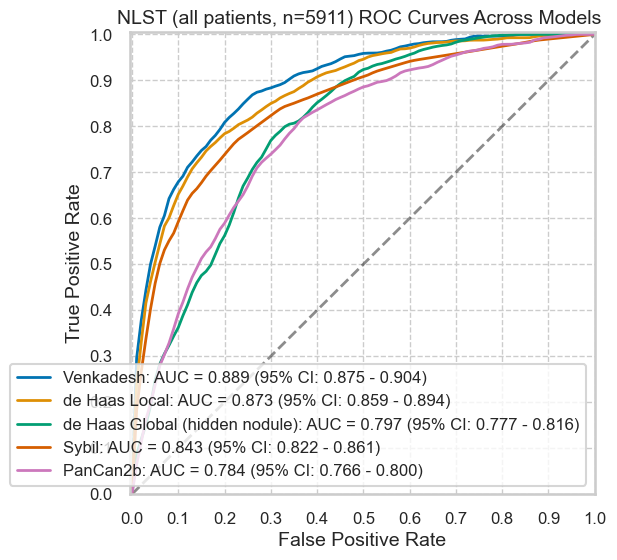

In [6]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [ ]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("Not binary: not computing significance test results.")

    # for m in perfs:
    #     print(m)
    #     display(perfs[m])

## Split Data by a Category

#### Married

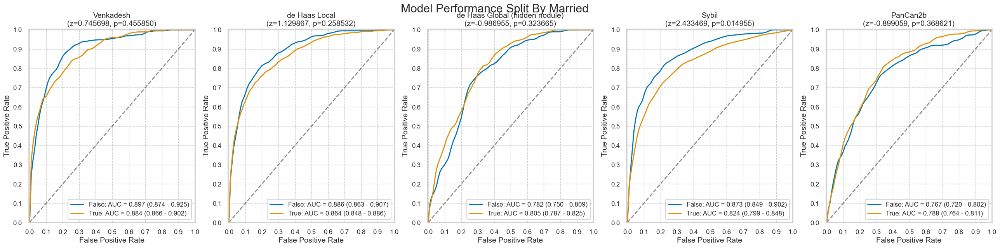

,num,pct,num_mal,pct_mal
False,1937,32.769413,197,10.170367
True,3974,67.230587,384,9.662808


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.745698,1.129867,-0.986955,2.433469,-0.899059
p,0.455850,0.258532,0.323665,0.014955,0.368621


In [18]:
SPLIT_CAT = 'Married'
split_groups = nlst_preds.groupby(SPLIT_CAT)
plot_by_category(nlst_preds, SPLIT_CAT)

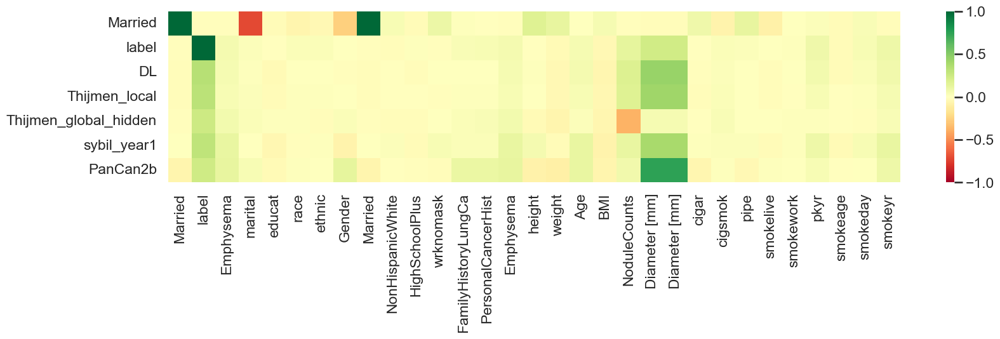

In [19]:
cols_list = list(set([SPLIT_CAT, 'label', 'Emphysema'] + list(MODEL_TO_COL.values()) + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]'] + nlst_democols['cat']['smoke'] + nlst_democols['num']['smoke'] ))
correlations = nlst_preds[cols_list].corr(method='kendall').round(4)

corr_rows = [SPLIT_CAT, 'label'] + list(MODEL_TO_COL.values())
corr_cols = [SPLIT_CAT, 'label', 'Emphysema'] + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]'] + nlst_democols['cat']['smoke'] + nlst_democols['num']['smoke'] 
plt.figure(figsize=(len(corr_cols) * 0.6, len(corr_rows) * 0.5))
sns.heatmap(correlations.loc[corr_rows, corr_cols], cmap='RdYlGn', vmin=-1, vmax=1)
plt.show()

## Plot intersectional results by category

In [20]:
def plot_intersectional(df, cat, split_cat=SPLIT_CAT, split_groups=split_groups):
    if cat == split_cat: return
    for splitval, splitdf in split_groups:
        display(Markdown(f"#### {cat}: {split_cat} = {splitval}"))
        catinfo, perfs, sigtestresults = utils.roc_cm_by_category(splitdf, cat, MODEL_TO_COL)
        display(catinfo)
        
        if sigtestresults is not None:
            print("Hanley-McNeil significance test results:")
            display(sigtestresults)
        else:
            print("More than binary: not computing significance test results.")

        # for m in perfs:
        #     print(m)
        #     display(perfs[m])

### Included columns (from predictions)

#### wrknomask: Married = False

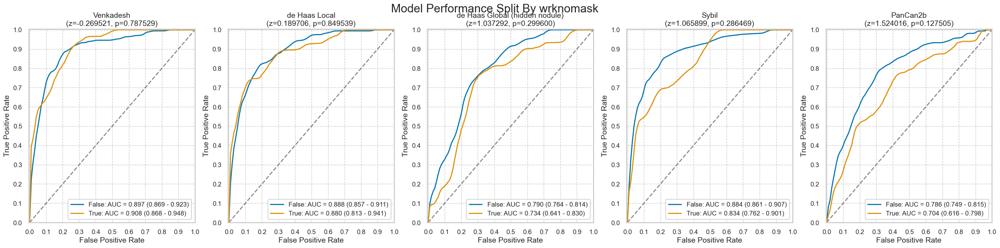

,num,pct,num_mal,pct_mal
False,1561,80.588539,164,10.506086
True,376,19.411461,33,8.776596


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.269521,0.189706,1.037292,1.065899,1.524016
p,0.787529,0.849539,0.299600,0.286469,0.127505


#### wrknomask: Married = True

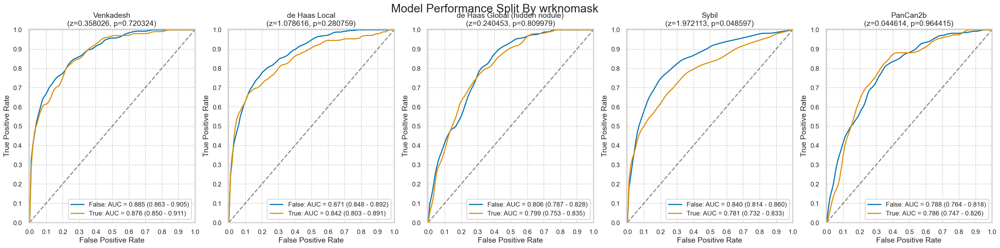

,num,pct,num_mal,pct_mal
False,2846,71.615501,278,9.768096
True,1128,28.384499,106,9.397163


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.358026,1.078616,0.240453,1.972113,0.044614
p,0.720324,0.280759,0.809979,0.048597,0.964415


#### FamilyHistoryLungCa: Married = False

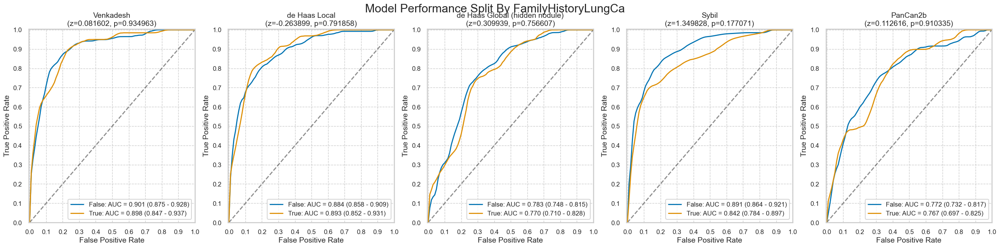

,num,pct,num_mal,pct_mal
False,1447,74.703149,139,9.606082
True,490,25.296851,58,11.836735


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.081602,-0.263899,0.309939,1.349828,0.112616
p,0.934963,0.791858,0.756607,0.177071,0.910335


#### FamilyHistoryLungCa: Married = True

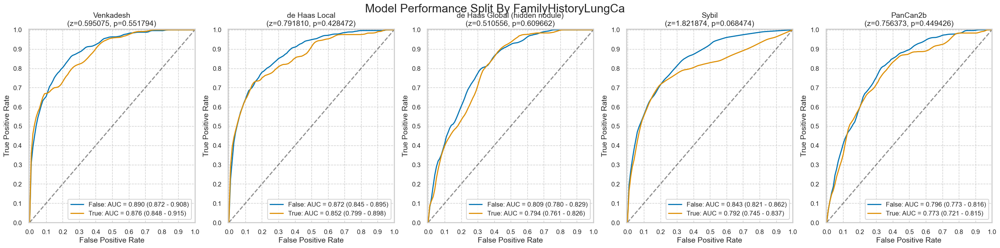

,num,pct,num_mal,pct_mal
False,2937,73.905385,262,8.920667
True,1037,26.094615,122,11.764706


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.595075,0.791810,0.510556,1.821874,0.756373
p,0.551794,0.428472,0.609662,0.068474,0.449426


#### PersonalCancerHist: Married = False

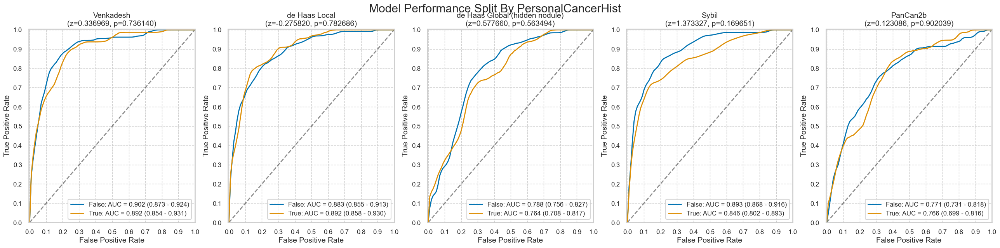

,num,pct,num_mal,pct_mal
False,1365,70.469799,129,9.450549
True,572,29.530201,68,11.888112


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.336969,-0.275820,0.577660,1.373327,0.123086
p,0.736140,0.782686,0.563494,0.169651,0.902039


#### PersonalCancerHist: Married = True

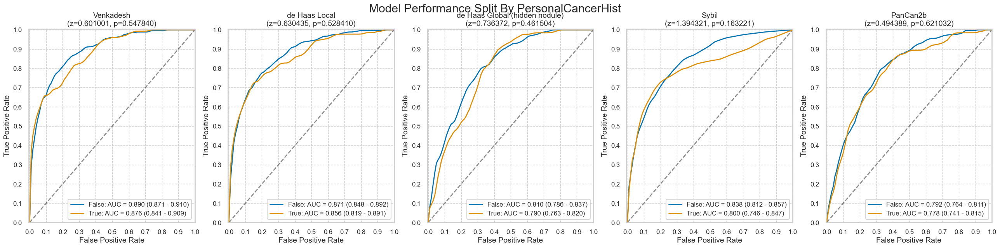

,num,pct,num_mal,pct_mal
False,2818,70.910921,248,8.800568
True,1156,29.089079,136,11.764706


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.601001,0.630435,0.736372,1.394321,0.494389
p,0.547840,0.528410,0.461504,0.163221,0.621032


#### Emphysema: Married = False

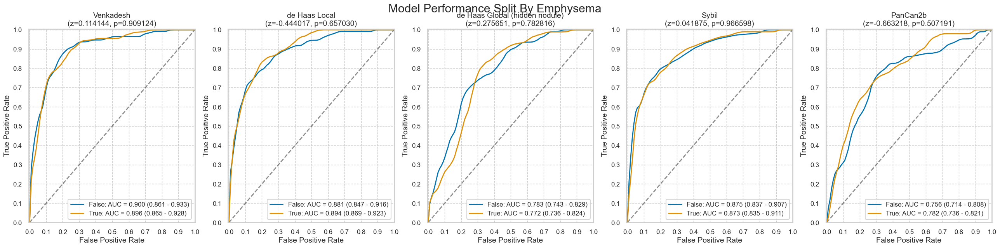

,num,pct,num_mal,pct_mal
False,1218,62.880743,109,8.949097
True,719,37.119257,88,12.239221


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.114144,-0.444017,0.275651,0.041875,-0.663218
p,0.909124,0.657030,0.782816,0.966598,0.507191


#### Emphysema: Married = True

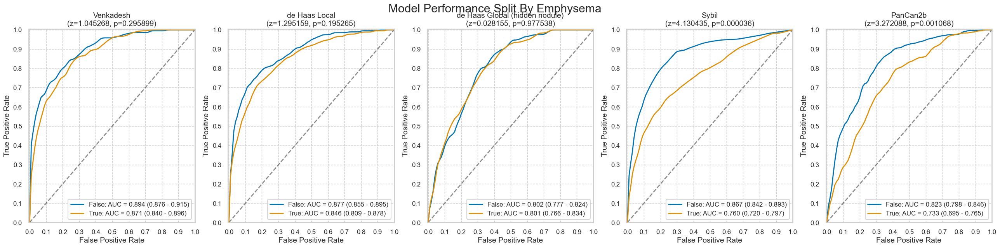

,num,pct,num_mal,pct_mal
False,2537,63.83996,208,8.198660
True,1437,36.16004,176,12.247738


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.045268,1.295159,0.028155,4.130435,3.272088
p,0.295899,0.195265,0.977538,0.000036,0.001068


In [21]:
for c in nlst_democols['cat']['other']:
    plot_intersectional(nlst_preds, c)

### Demographics

#### marital: Married = False

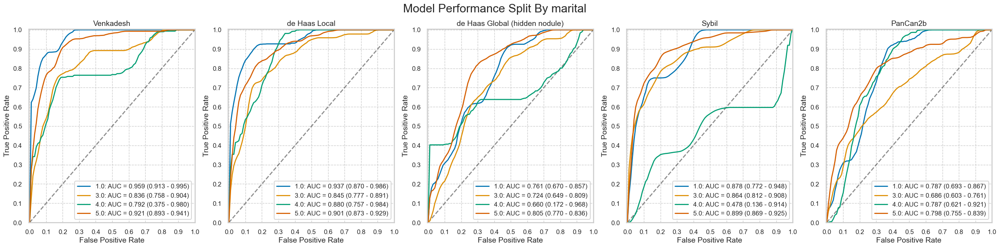

,num,pct,num_mal,pct_mal
1.0,229,11.902287,16,6.986900
3.0,507,26.351351,49,9.664694
4.0,65,3.378378,5,7.692308
5.0,1123,58.367983,125,11.130899


More than binary: not computing significance test results.


#### marital: Married = True

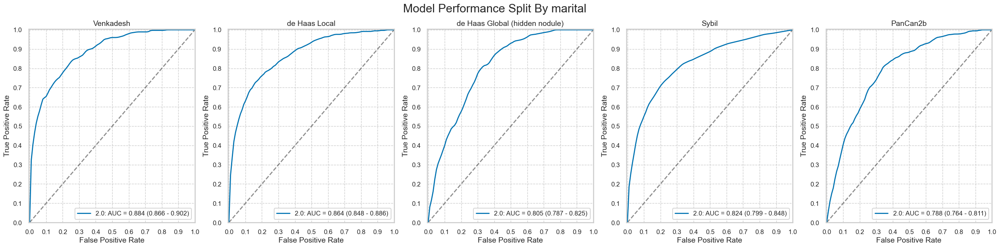

,num,pct,num_mal,pct_mal
2.0,3974,100.0,384,9.662808


More than binary: not computing significance test results.


#### educat: Married = False

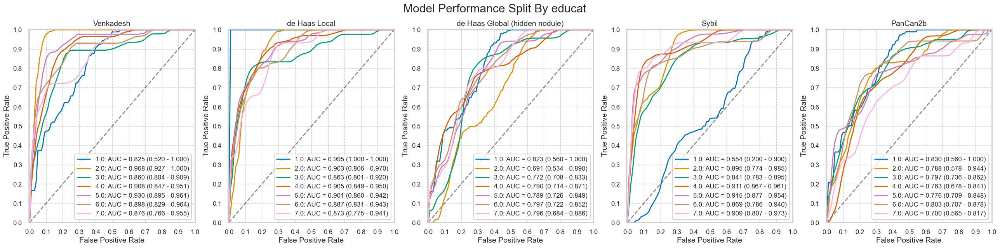

,num,pct,num_mal,pct_mal
1.0,26,1.372032,2,7.692308
2.0,85,4.485488,6,7.058824
3.0,474,25.013193,47,9.915612
4.0,260,13.720317,34,13.076923
5.0,444,23.430079,51,11.486486
6.0,315,16.622691,31,9.841270
7.0,291,15.356201,15,5.154639


More than binary: not computing significance test results.


#### educat: Married = True

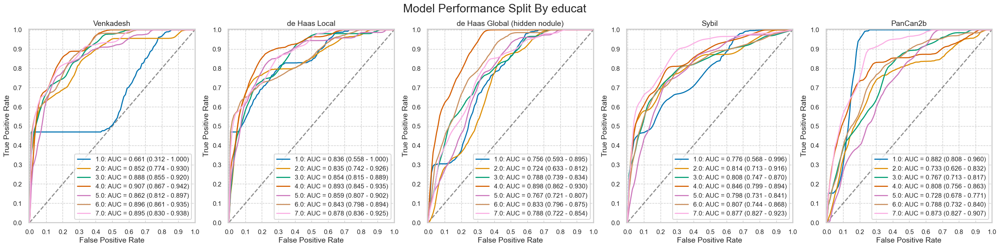

,num,pct,num_mal,pct_mal
1.0,85,2.176697,7,8.235294
2.0,205,5.249680,26,12.682927
3.0,1005,25.736236,94,9.353234
4.0,592,15.160051,53,8.952703
5.0,857,21.946223,75,8.751459
6.0,598,15.313700,65,10.869565
7.0,563,14.417414,61,10.834813


More than binary: not computing significance test results.


#### race: Married = False

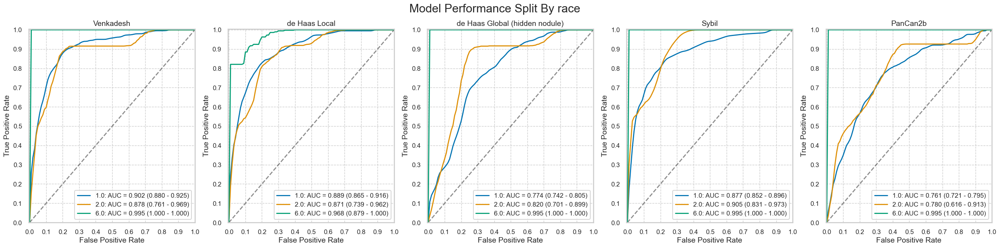

,num,pct,num_mal,pct_mal
1.0,1764,91.351631,176,9.977324
2.0,113,5.851890,14,12.389381
3.0,27,1.398239,1,3.703704
4.0,7,0.362506,0,0.000000
5.0,6,0.310720,1,16.666667
6.0,14,0.725013,4,28.571429


More than binary: not computing significance test results.


#### race: Married = True

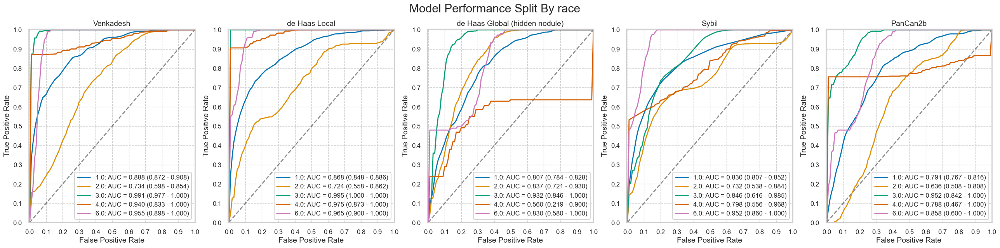

,num,pct,num_mal,pct_mal
1.0,3759,94.972208,354,9.417398
2.0,75,1.894896,14,18.666667
3.0,45,1.136938,5,11.111111
4.0,16,0.404245,8,50.000000
5.0,12,0.303183,0,0.000000
6.0,51,1.288530,2,3.921569


More than binary: not computing significance test results.


#### ethnic: Married = False

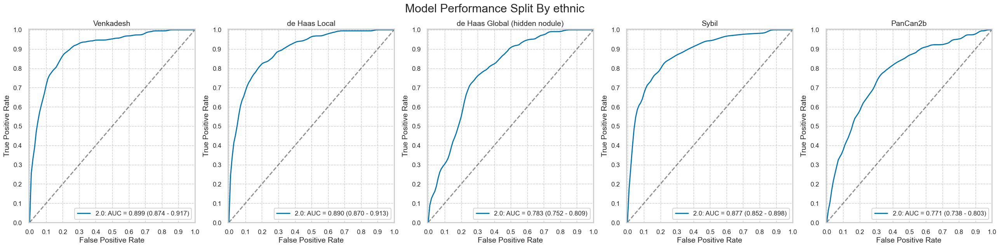

,num,pct,num_mal,pct_mal
1.0,18,0.93361,0,0.000000
2.0,1910,99.06639,195,10.209424


More than binary: not computing significance test results.


#### ethnic: Married = True

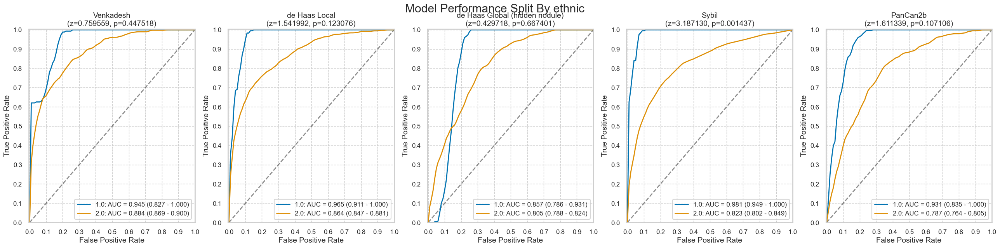

,num,pct,num_mal,pct_mal
1.0,80,2.025829,4,5.000000
2.0,3869,97.974171,379,9.795813


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.759559,1.541992,0.429718,3.187130,1.611339
p,0.447518,0.123076,0.667401,0.001437,0.107106


#### Gender: Married = False

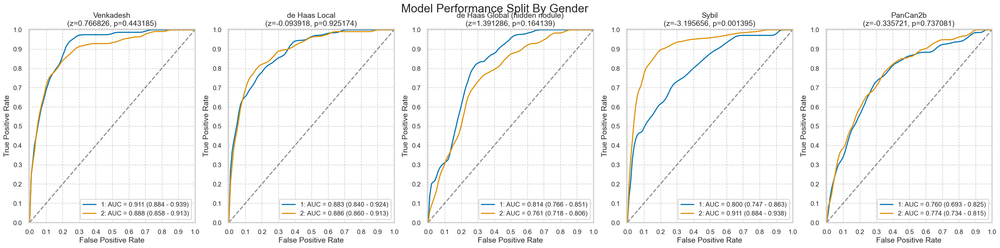

,num,pct,num_mal,pct_mal
1,772,39.855447,75,9.715026
2,1165,60.144553,122,10.472103


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.766826,-0.093918,1.391286,-3.195656,-0.335721
p,0.443185,0.925174,0.164139,0.001395,0.737081


#### Gender: Married = True

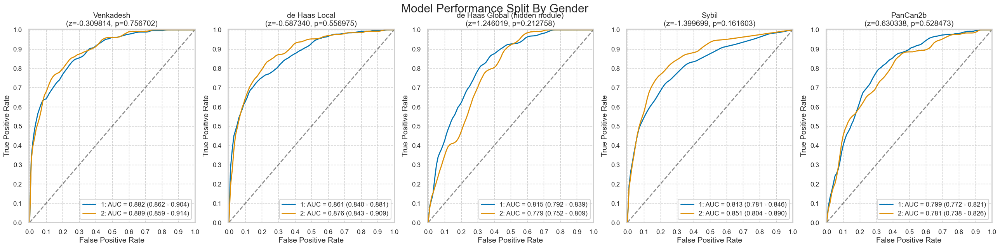

,num,pct,num_mal,pct_mal
1,2669,67.16155,262,9.816411
2,1305,32.83845,122,9.348659


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.309814,-0.587340,1.246019,-1.399699,0.630338
p,0.756702,0.556975,0.212758,0.161603,0.528473


#### NonHispanicWhite: Married = False

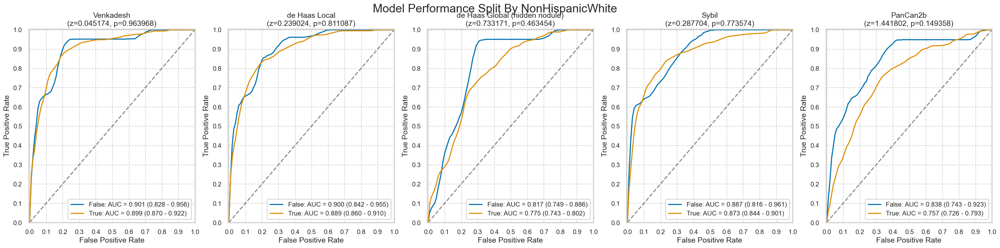

,num,pct,num_mal,pct_mal
False,192,9.912235,22,11.458333
True,1745,90.087765,175,10.028653


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.045174,0.239024,0.733171,0.287704,1.441802
p,0.963968,0.811087,0.463454,0.773574,0.149358


#### NonHispanicWhite: Married = True

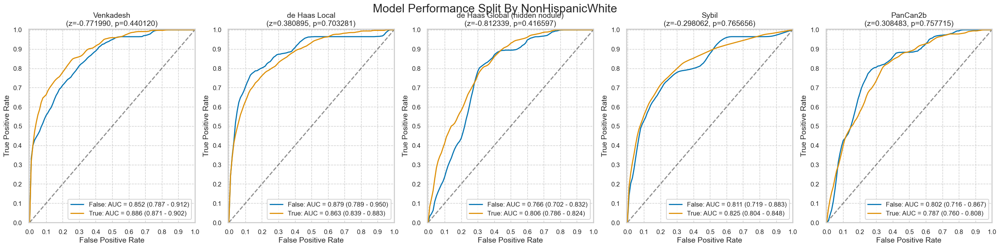

,num,pct,num_mal,pct_mal
False,289,7.27227,33,11.418685
True,3685,92.72773,351,9.525102


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.77199,0.380895,-0.812339,-0.298062,0.308483
p,0.44012,0.703281,0.416597,0.765656,0.757715


#### HighSchoolPlus: Married = False

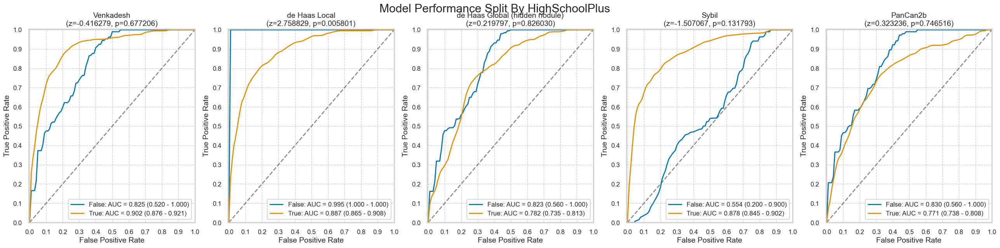

,num,pct,num_mal,pct_mal
False,26,1.342282,2,7.692308
True,1911,98.657718,195,10.204082


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.416279,2.758829,0.219797,-1.507067,0.323236
p,0.677206,0.005801,0.826030,0.131793,0.746516


#### HighSchoolPlus: Married = True

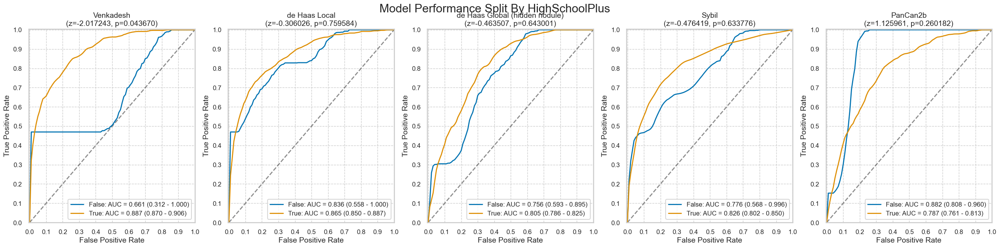

,num,pct,num_mal,pct_mal
False,85,2.138903,7,8.235294
True,3889,97.861097,377,9.694009


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-2.017243,-0.306026,-0.463507,-0.476419,1.125961
p,0.043670,0.759584,0.643001,0.633776,0.260182


In [22]:
for cat in nlst_democols['cat']['demo']:
    plot_intersectional(nlst_preds, cat)

### Smoking

#### cigar: Married = False

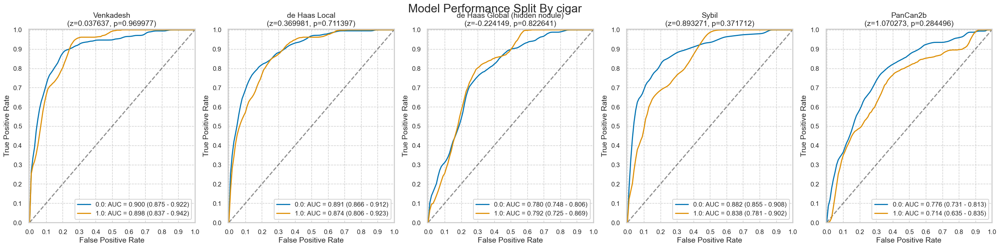

,num,pct,num_mal,pct_mal
0.0,1635,85.023401,168,10.275229
1.0,288,14.976599,28,9.722222


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.037637,0.369981,-0.224149,0.893271,1.070273
p,0.969977,0.711397,0.822641,0.371712,0.284496


#### cigar: Married = True

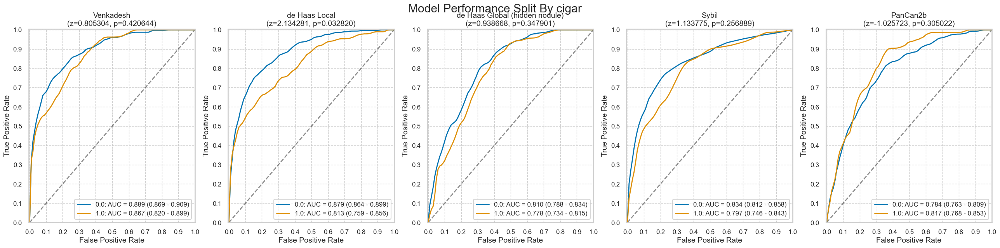

,num,pct,num_mal,pct_mal
0.0,3103,78.299268,302,9.732517
1.0,860,21.700732,81,9.418605


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.805304,2.134281,0.938668,1.133775,-1.025723
p,0.420644,0.032820,0.347901,0.256889,0.305022


#### cigsmok: Married = False

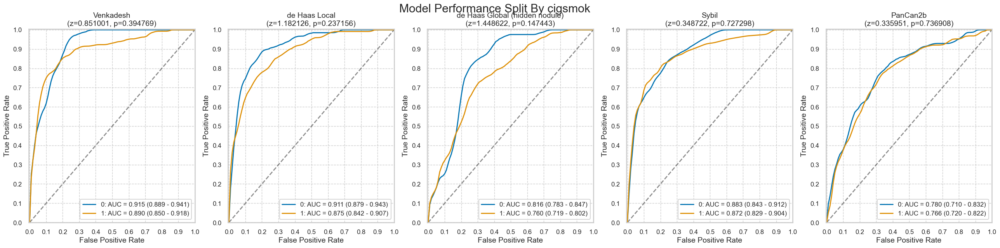

,num,pct,num_mal,pct_mal
0,859,44.346928,71,8.265425
1,1078,55.653072,126,11.688312


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.851001,1.182126,1.448622,0.348722,0.335951
p,0.394769,0.237156,0.147443,0.727298,0.736908


#### cigsmok: Married = True

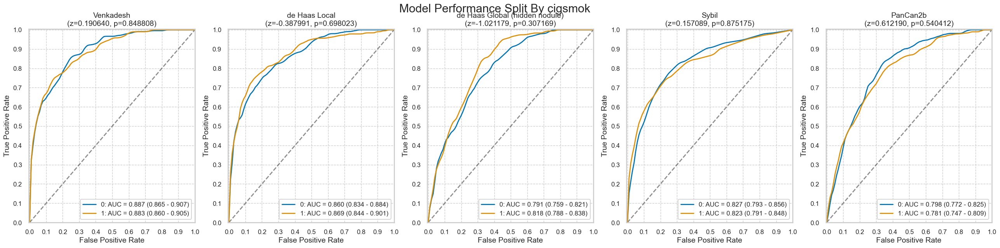

,num,pct,num_mal,pct_mal
0,2071,52.113739,196,9.464027
1,1903,47.886261,188,9.879138


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.190640,-0.387991,-1.021179,0.157089,0.612190
p,0.848808,0.698023,0.307169,0.875175,0.540412


#### pipe: Married = False

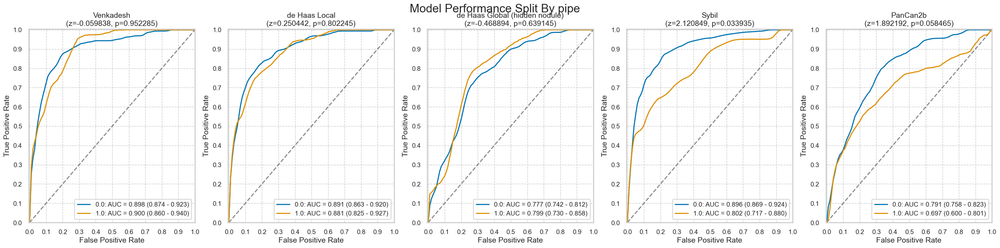

,num,pct,num_mal,pct_mal
0.0,1629,84.84375,157,9.637815
1.0,291,15.15625,39,13.402062


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.059838,0.250442,-0.468894,2.120849,1.892192
p,0.952285,0.802245,0.639145,0.033935,0.058465


#### pipe: Married = True

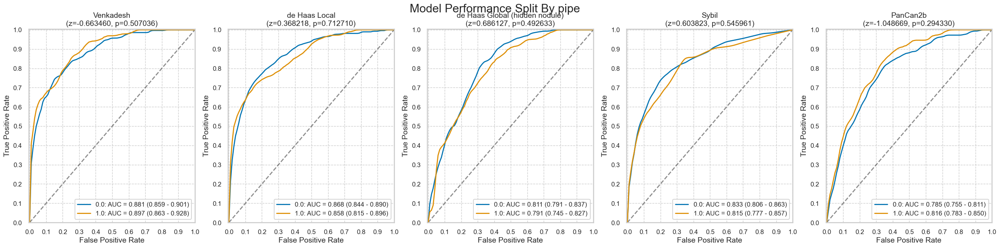

,num,pct,num_mal,pct_mal
0.0,2946,74.469161,279,9.470468
1.0,1010,25.530839,104,10.297030


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.663460,0.368218,0.686127,0.603823,-1.048669
p,0.507036,0.712710,0.492633,0.545961,0.294330


#### smokelive: Married = False

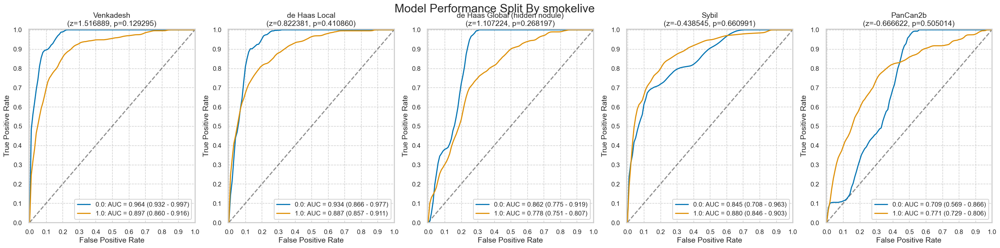

,num,pct,num_mal,pct_mal
0.0,141,7.332293,10,7.092199
1.0,1782,92.667707,186,10.437710


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.516889,0.822381,1.107224,-0.438545,-0.666622
p,0.129295,0.410860,0.268197,0.660991,0.505014


#### smokelive: Married = True

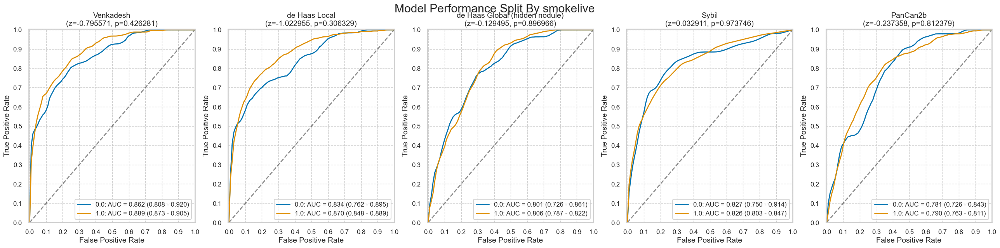

,num,pct,num_mal,pct_mal
0.0,524,13.255755,54,10.305344
1.0,3429,86.744245,328,9.565471


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.795571,-1.022955,-0.129495,0.032911,-0.237358
p,0.426281,0.306329,0.896966,0.973746,0.812379


#### smokework: Married = False

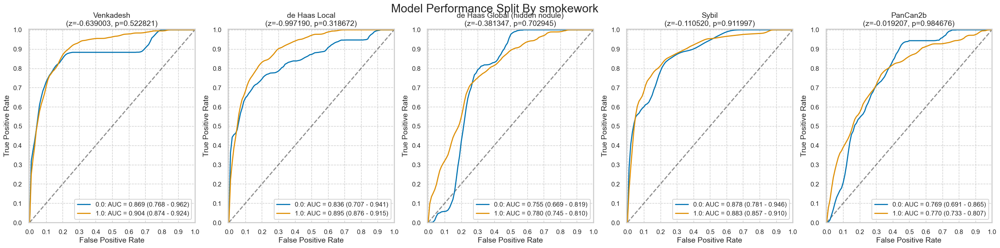

,num,pct,num_mal,pct_mal
0.0,238,12.441192,19,7.983193
1.0,1675,87.558808,175,10.447761


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.639003,-0.997190,-0.381347,-0.110520,-0.019207
p,0.522821,0.318672,0.702945,0.911997,0.984676


#### smokework: Married = True

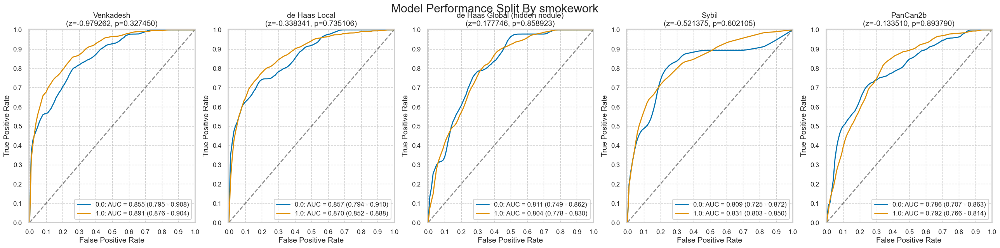

,num,pct,num_mal,pct_mal
0.0,484,12.253165,46,9.504132
1.0,3466,87.746835,337,9.723024


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.979262,-0.338341,0.177746,-0.521375,-0.13351
p,0.327450,0.735106,0.858923,0.602105,0.89379


In [23]:
for cat in nlst_democols['cat']['smoke']:
    plot_intersectional(nlst_preds, cat)

## Binning for numerical demographic columns

### Demographics

C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\1174269980.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               height  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                    
(52.999, 68.0]  3134.0  0.099553  0.299451  0.0  0.0  0.0  0.0  1.0  3134.0   
(68.0, 83.0]    2767.0  0.096494  0.295321  0.0  0.0  0.0  0.0  1.0  2767.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_height                                                         
(52.999, 68.0]  64.869177  2.355045  53.0  63.0  65.0  67.0  68.0  
(68.0, 83.0]    71.503072  1.994545  69.0  70.0  71.0  73.0  83.0

#### bin_height: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


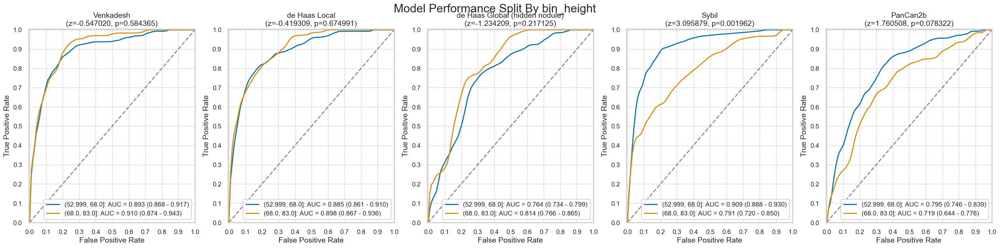

,num,pct,num_mal,pct_mal
"(52.999, 68.0]",1285,66.373967,136,10.583658
"(68.0, 83.0]",651,33.626033,60,9.216590


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.547020,-0.419309,-1.234209,3.095879,1.760508
p,0.584365,0.674991,0.217125,0.001962,0.078322


#### bin_height: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


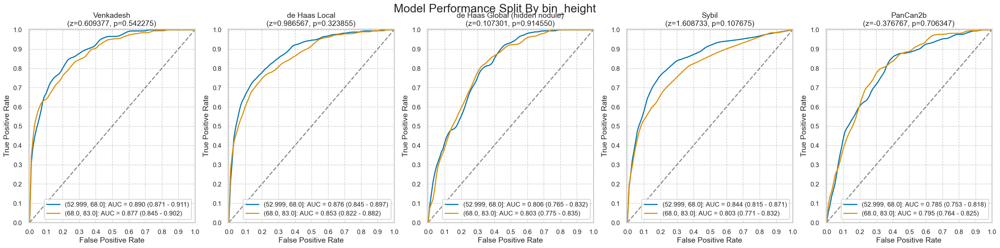

,num,pct,num_mal,pct_mal
"(52.999, 68.0]",1849,46.633039,176,9.518659
"(68.0, 83.0]",2116,53.366961,207,9.782609


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.609377,0.986567,0.107301,1.608733,-0.376767
p,0.542275,0.323855,0.914550,0.107675,0.706347


C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\1174269980.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                               weight  \
                  count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                     
(74.999, 180.0]  3082.0  0.106424  0.308430  0.0  0.0  0.0  0.0  1.0  3082.0   
(180.0, 368.0]   2816.0  0.087713  0.282927  0.0  0.0  0.0  0.0  1.0  2816.0   

                                                                           
                       mean        std    min    25%    50%    75%    max  
bin_weight                                                                 
(74.999, 180.0]  152.228423  20.400591   75.0  139.0  155.0  170.0  180.0  
(180.0, 368.0]   214.422585  27.365632  181.0  193.0  208.0  230.0  368.0

#### bin_weight: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


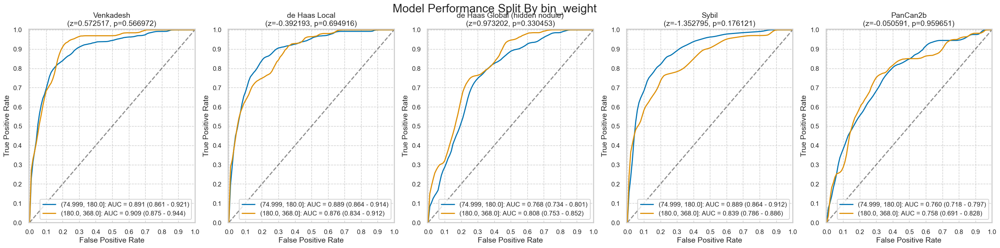

,num,pct,num_mal,pct_mal
"(74.999, 180.0]",1159,59.989648,135,11.647972
"(180.0, 368.0]",773,40.010352,59,7.632600


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.572517,-0.392193,0.973202,-1.352795,-0.050591
p,0.566972,0.694916,0.330453,0.176121,0.959651


#### bin_weight: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


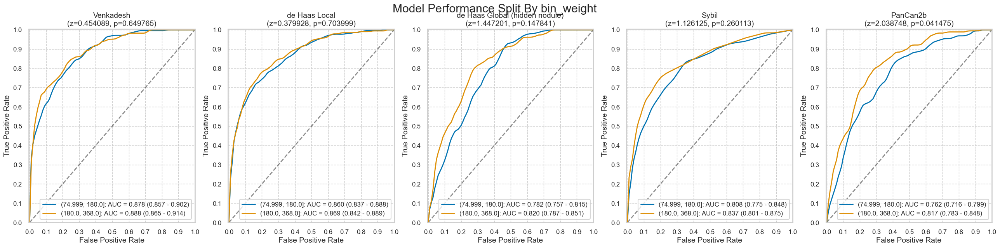

,num,pct,num_mal,pct_mal
"(74.999, 180.0]",1923,48.487141,193,10.036401
"(180.0, 368.0]",2043,51.512859,188,9.202154


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.454089,0.379928,1.447201,1.126125,2.038748
p,0.649765,0.703999,0.147841,0.260113,0.041475


C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\1174269980.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                  Age  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_Age                                                                       
(53.999, 62.0]  2988.0  0.088353  0.283856  0.0  0.0  0.0  0.0  1.0  2988.0   
(62.0, 76.0]    2923.0  0.108450  0.311001  0.0  0.0  0.0  0.0  1.0  2923.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_Age                                                            
(53.999, 62.0]  58.811245  2.123374  54.0  57.0  59.0  61.0  62.0  
(62.0, 76.0]    67.653780  3.453298  63.0  65.0  67.0  70.0  76.0

#### bin_Age: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


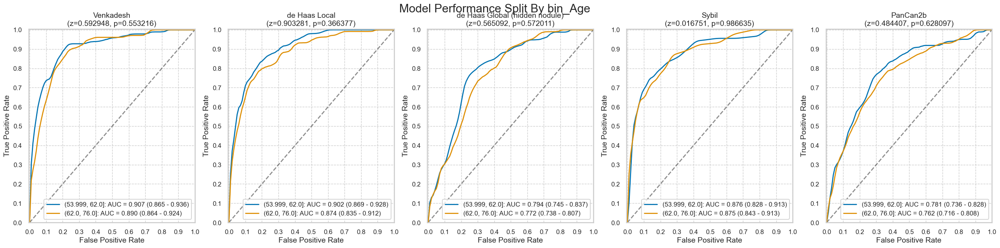

,num,pct,num_mal,pct_mal
"(53.999, 62.0]",979,50.542075,97,9.908069
"(62.0, 76.0]",958,49.457925,100,10.438413


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.592948,0.903281,0.565092,0.016751,0.484407
p,0.553216,0.366377,0.572011,0.986635,0.628097


#### bin_Age: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


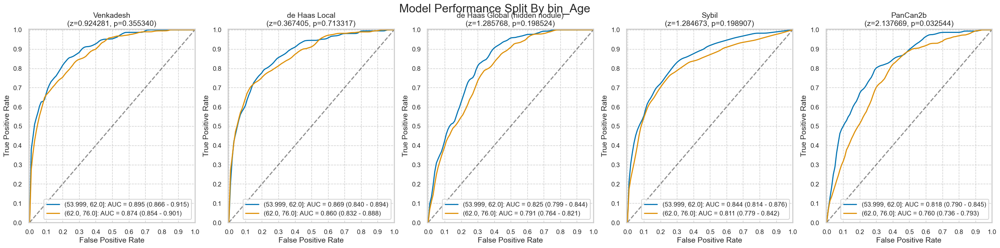

,num,pct,num_mal,pct_mal
"(53.999, 62.0]",2009,50.553598,167,8.312593
"(62.0, 76.0]",1965,49.446402,217,11.043257


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.924281,0.367405,1.285768,1.284673,2.137669
p,0.355340,0.713317,0.198524,0.198907,0.032544


C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\1174269980.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                          \
                              count      mean       std  min  25%  50%  75%   
bin_BMI                                                                       
(13.283000000000001, 26.87]  2956.0  0.112314  0.315806  0.0  0.0  0.0  0.0   
(26.87, 57.631]              2936.0  0.082425  0.275058  0.0  0.0  0.0  0.0   

                                     BMI                                  \
                             max   count       mean       std        min   
bin_BMI                                                                    
(13.283000000000001, 26.87]  1.0  2956.0  23.753599  2.257101  13.284203   
(26.87, 57.631]              1.0  2936.0  31.382861  3.818099  26.873766   

                                                                         
                                   25%        50%        75%        max  
bin_BMI                                                                  
(13.283000000000001, 26.87]  22.312778  24.207989  25.603538  26.870222  
(26.87, 57.631]              28.478009  30.406574  33.190637  57.630653

#### bin_BMI: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


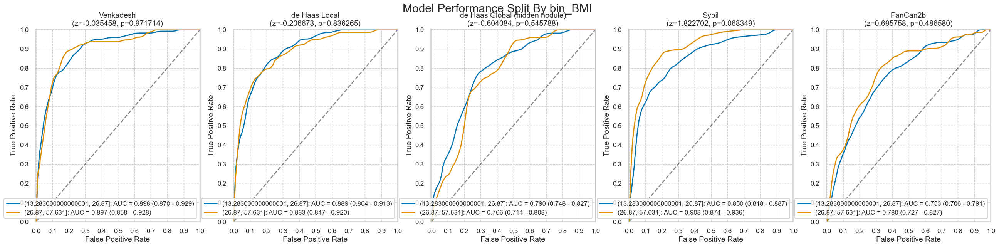

,num,pct,num_mal,pct_mal
"(13.283000000000001, 26.87]",1021,52.846791,120,11.753183
"(26.87, 57.631]",911,47.153209,74,8.122942


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.035458,-0.206673,-0.604084,1.822702,0.695758
p,0.971714,0.836265,0.545788,0.068349,0.486580


#### bin_BMI: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


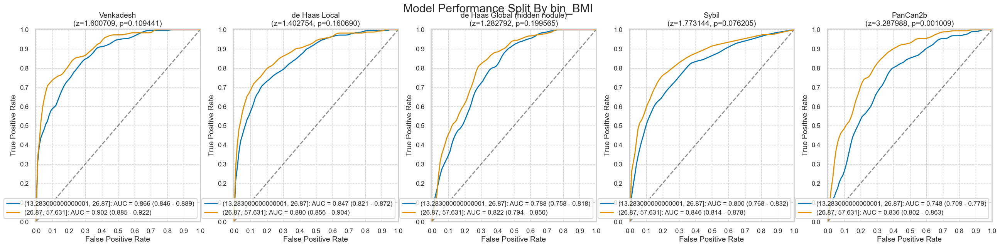

,num,pct,num_mal,pct_mal
"(13.283000000000001, 26.87]",1935,48.863636,212,10.956072
"(26.87, 57.631]",2025,51.136364,168,8.296296


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.600709,1.402754,1.282792,1.773144,3.287988
p,0.109441,0.160690,0.199565,0.076205,0.001009


In [24]:
for c in nlst_democols['num']['demo']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_intersectional(nlst_preds, f'bin_{c}')

In [25]:
# nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
# display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
# plot_intersectional(nlst_preds, f'bin_height')

In [26]:
# nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
# display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
# plot_intersectional(nlst_preds, f'bin_weight')

### Smoking

C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  3027.0  0.079617  0.270744  0.0  0.0  0.0  0.0  1.0  3027.0   
(51.0, 260.0]   2884.0  0.117892  0.322536  0.0  0.0  0.0  0.0  1.0  2884.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  40.627800   5.760036  30.00  36.0  41.0  45.0   51.0  
(51.0, 260.0]   76.879785  24.261537  51.25  60.0  70.0  87.5  260.0

#### bin_pkyr: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


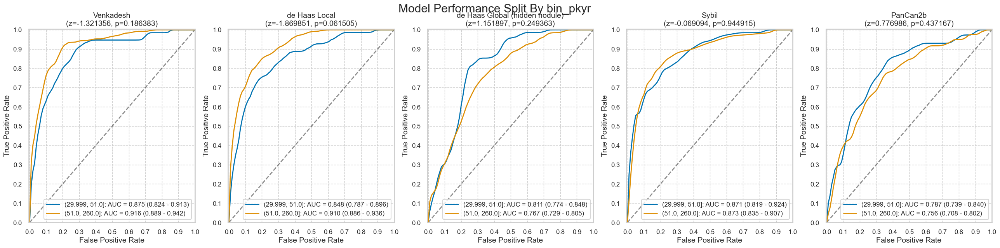

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",1021,52.710377,73,7.149853
"(51.0, 260.0]",916,47.289623,124,13.537118


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.321356,-1.869851,1.151897,-0.069094,0.776986
p,0.186383,0.061505,0.249363,0.944915,0.437167


#### bin_pkyr: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


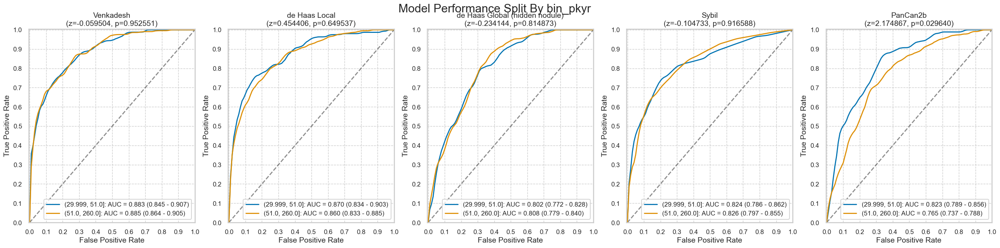

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",2006,50.478108,168,8.374875
"(51.0, 260.0]",1968,49.521892,216,10.975610


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.059504,0.454406,-0.234144,-0.104733,2.174867
p,0.952551,0.649537,0.814873,0.916588,0.029640


C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(4.999, 16.0]  3256.0  0.106572  0.308616  0.0  0.0  0.0  0.0  1.0   3256.0   
(16.0, 40.0]   2655.0  0.088136  0.283545  0.0  0.0  0.0  0.0  1.0   2655.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.136978  2.000377   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.381544  2.716198  17.0  18.0  18.0  20.0  40.0

#### bin_smokeage: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


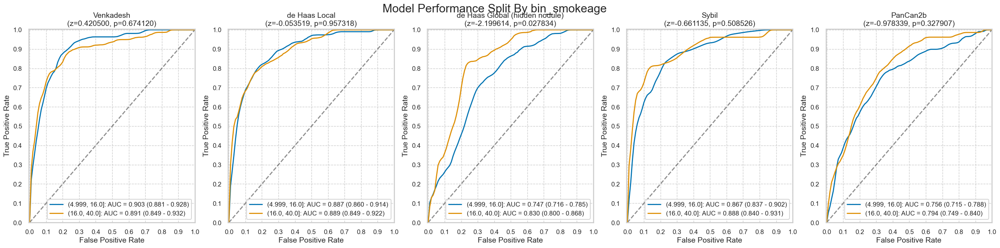

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",1054,54.414042,118,11.195446
"(16.0, 40.0]",883,45.585958,79,8.946772


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.42050,-0.053519,-2.199614,-0.661135,-0.978339
p,0.67412,0.957318,0.027834,0.508526,0.327907


#### bin_smokeage: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


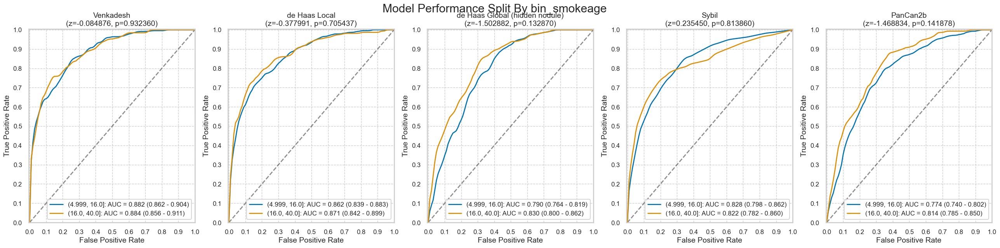

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",2202,55.410166,229,10.399637
"(16.0, 40.0]",1772,44.589834,155,8.747178


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.084876,-0.377991,-1.502882,0.23545,-1.468834
p,0.932360,0.705437,0.132870,0.81386,0.141878


C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  3119.0  0.089772  0.285901  0.0  0.0  0.0  0.0  1.0   3119.0   
(25.0, 135.0]   2792.0  0.107808  0.310193  0.0  0.0  0.0  0.0  1.0   2792.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.117025   2.153974  12.0  20.0  20.0  20.0   25.0  
(25.0, 135.0]   38.157593  10.650142  26.0  30.0  40.0  40.0  135.0

#### bin_smokeday: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


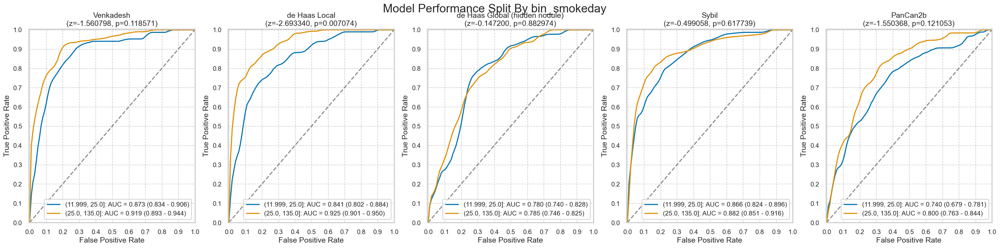

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1069,55.188436,90,8.419083
"(25.0, 135.0]",868,44.811564,107,12.327189


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.560798,-2.693340,-0.147200,-0.499058,-1.550368
p,0.118571,0.007074,0.882974,0.617739,0.121053


#### bin_smokeday: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


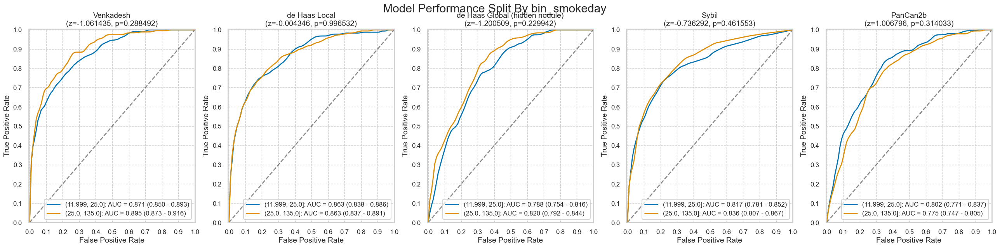

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",2050,51.585304,190,9.268293
"(25.0, 135.0]",1924,48.414696,194,10.083160


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.061435,-0.004346,-1.200509,-0.736292,1.006796
p,0.288492,0.996532,0.229942,0.461553,0.314033


C:\Users\shaur\AppData\Local\Temp\ipykernel_15552\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(15.999, 41.0]  3073.0  0.070290  0.255676  0.0  0.0  0.0  0.0  1.0  3073.0   
(41.0, 67.0]    2838.0  0.128612  0.334829  0.0  0.0  0.0  0.0  1.0  2838.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(15.999, 41.0]  35.559714  4.645131  16.0  33.0  36.0  39.0  41.0  
(41.0, 67.0]    47.241720  4.421492  42.0  44.0  46.0  50.0  67.0

#### bin_smokeyr: Married = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


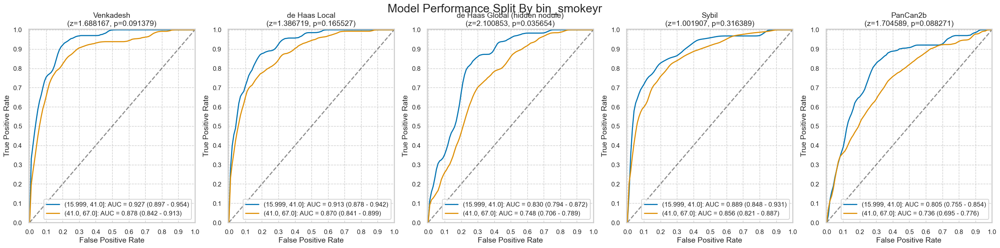

,num,pct,num_mal,pct_mal
"(15.999, 41.0]",980,50.593702,65,6.632653
"(41.0, 67.0]",957,49.406298,132,13.793103


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.688167,1.386719,2.100853,1.001907,1.704589
p,0.091379,0.165527,0.035654,0.316389,0.088271


#### bin_smokeyr: Married = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


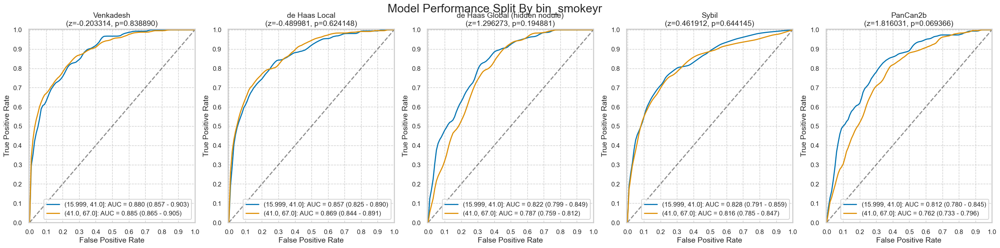

,num,pct,num_mal,pct_mal
"(15.999, 41.0]",2093,52.667338,151,7.214525
"(41.0, 67.0]",1881,47.332662,233,12.387028


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.203314,-0.489981,1.296273,0.461912,1.816031
p,0.838890,0.624148,0.194881,0.644145,0.069366


In [27]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_intersectional(nlst_preds, f'bin_{c}')